# Рынок заведений общественного питания Москвы

План работ:
 - Выгрузим библиотеки для работы
 - Выгрузим датасет
 - Обработаем его, подготовим для дальнейшего анализа
 - Построим графики, картограмму проведем анализ данных 
 - Детализируем исследование: открытие кофейни
 - Нарисуем презентацию для инвесторов 
 

## Работа с  данными

### Импортируем библиотеки 

In [1]:
# подключаем библиотеки
import pandas as pd
import datetime as dt
import numpy as np
import matplotlib.pyplot as plt
from pandas.plotting import register_matplotlib_converters
import warnings
from scipy import stats as st
import math as mth
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
!pip install folium --upgrade
from folium import Map
from folium.features import GeoJson
from folium.plugins import HeatMap, MarkerCluster
from folium import Map, Marker
import json
import folium
from IPython.display import display, HTML

# импортируем кластер
from folium.plugins import MarkerCluster
warnings.filterwarnings('ignore')
# конвертеры, которые позволяют использовать типы pandas в matplotlib  
register_matplotlib_converters()

### Сохраняем датасет в переменную moscow_places

In [2]:
moscow_places = pd.read_csv('/Users/nikitaromanov/nikitaaromanovv/data-analytics-projects/food-market-analysis/moscow_places.csv')

In [3]:

# Установить стиль таблицы для широкого вывода
wide_style = "<style>table {width:100%}</style>"
HTML(wide_style)

# Вывести таблицу
display(moscow_places.head(5))


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


Обнаружили пропуски в некоторых столбцах, в дальнейшем разберемся в причинах пропусков и обработаем их.

In [4]:
moscow_places.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


## Подготовка данных для анализа

### Предобработка данных 

Заменим в столбце 'chain' тип данных с int на object. Для большей информативности.

In [5]:
moscow_places['chain'] = moscow_places['chain'].replace({0: 'Не сетевое', 1: 'Сетевое'})

Ищем пустые строки.

In [6]:
# Поиск строк без данных (NaN)
rows_with_nan = moscow_places[moscow_places.isnull().all(axis=1)]

print(rows_with_nan);

Empty DataFrame
Columns: [name, category, address, district, hours, lat, lng, rating, price, avg_bill, middle_avg_bill, middle_coffee_cup, chain, seats]
Index: []


На первый взгляд типы данных верно отображают каждый столбец.

Выведем пропуски по столбцам.

In [7]:
# Функция визуализации пропусков
def plot_missing_values(df):
    try:
        # Выводим процент пропусков по каждому столбцу и превращаем это в таблицу.
        missing_values = (df.isna().mean() * 100).to_frame().rename(columns={0: 'Процент пропусков'})
        # Отбираем только не нулевые значение и сортируем по возрастанию.
        missing_values = missing_values[missing_values['Процент пропусков'] > 0].sort_values(by='Процент пропусков', ascending=True)

        # Настройки графика
        figsize = (10, 6)
        title = 'Пропуски\n'
        title_fontsize = 22
        title_color = 'steelblue'
        fontsize = 12

        plt.figure(figsize=figsize)
        sns.barplot(x='Процент пропусков', y=missing_values.index, data=missing_values, palette='Blues_r')
        plt.title(title, fontsize=title_fontsize, color=title_color)
        plt.xlabel('Процент пропусков', fontsize=fontsize)
        plt.ylabel('Столбцы', fontsize=fontsize)
        plt.xticks(fontsize=fontsize)
        plt.yticks(fontsize=fontsize)
        plt.show()
    except Exception as e:
        # если пропусков нет выведем:
        print('Произошла ошибка: {}'.format(str(e)))



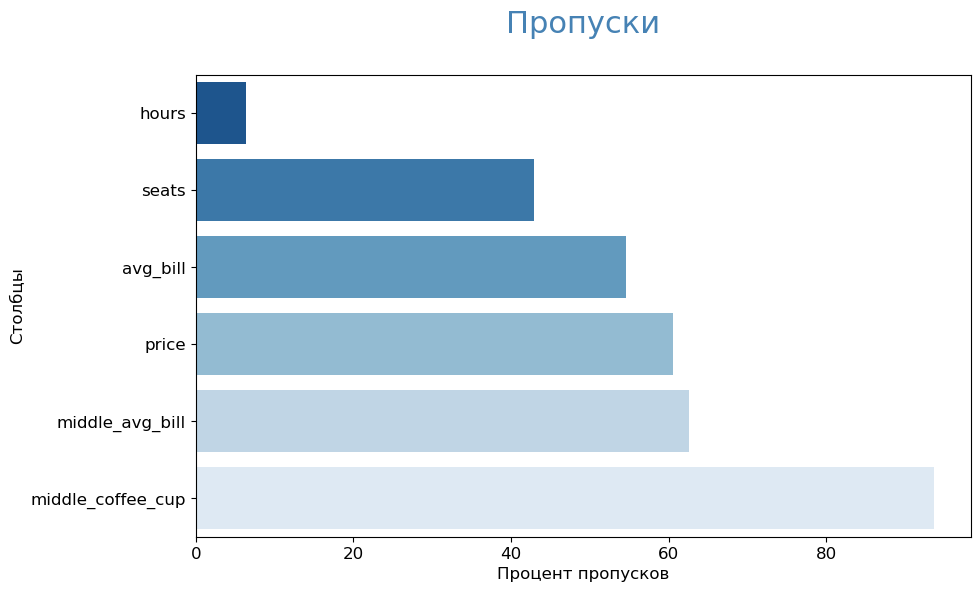

In [8]:
plot_missing_values(moscow_places)

Очень много пропусках в столбцах: middle_coffee_cup - число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill
middle_avg_bill -  число с оценкой среднего чека, которое указано только для значений из столбца avg_bill
price - категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее
avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона 
На первый взгляд можно сказать, что пропуски middle_coffee_cup и middle_avg_bill связаны с пропусками в столбце avg_bill
seats -  количество посадочных мест.
Пропуски в столбах middle_avg_bill и middle_coffee_cup это следствие пропусков в столбце avg_bill.
middle_coffee_cup так же может не заполняться если в этом заведении не продается кофе.
пропуске в столбцах price и hours и seats можно обусловить необязательностью этих данных.


Прверим дубликаты и перейдем к работе с проаусками.

In [9]:
# создаем список таблиц
tables = [moscow_places]
list_c = ['hours', 'price', 'avg_bill', 'middle_avg_bill', 'middle_coffee_cup', 'seats']
# проверяем наличие дубликатов в каждой таблице и выводим количество дубликатов
for i, df in enumerate(tables):
    duplicates = df.duplicated().sum()
    print(f"Таблица {i+1}: {duplicates} дубликатов.")

Таблица 1: 0 дубликатов.


Проверим неявные дубликаты по столбцу name и address

In [10]:
# Ищем дубликаты по двум столбцам 'name', 'address'
moscow_places_dub = moscow_places[['name','address']].duplicated().sum()
print(f"Количество неявных дубликатов {moscow_places_dub}.")

Количество неявных дубликатов 0.


Построим boxplot для столбца отражающего количество мест в заведении.

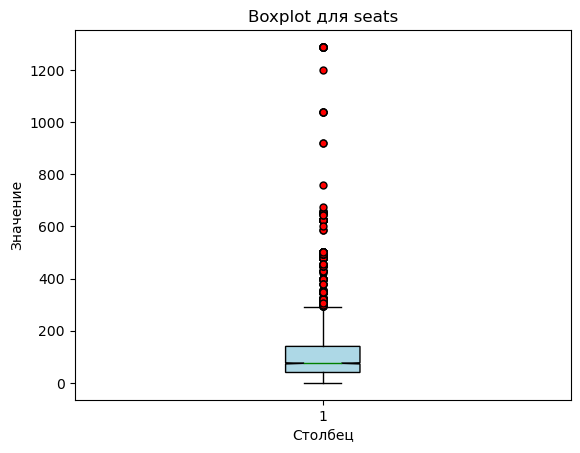

In [11]:

# Удаление строк с пропущенными значениями в столбце 'seats'
data_cleaned = moscow_places.dropna(subset=['seats'])

# Приведение столбца 'seats' к числовому типу данных
data_cleaned['seats'] = data_cleaned['seats'].astype(float)
# Построение boxplot для столбца 'seats'

plt.boxplot(data_cleaned['seats'], notch=True, patch_artist=True, boxprops=dict(facecolor='lightblue'), flierprops=dict(marker='o', markersize=5, markerfacecolor='red'), whiskerprops=dict(color='black'), medianprops=dict(color='green'))
# Настройка осей и заголовка

plt.xlabel('Столбец')
plt.ylabel('Значение')
plt.title('Boxplot для seats')

# Отображение графика
plt.show()

Удалим заведения с  аномально большим количесвом посадочных мест. Более 300 мест 

In [12]:
# Удаление строк с значением seats более 300 
moscow_places = moscow_places[(moscow_places['seats']<300)| (moscow_places['seats'].isnull())]

Строим boxplot заново

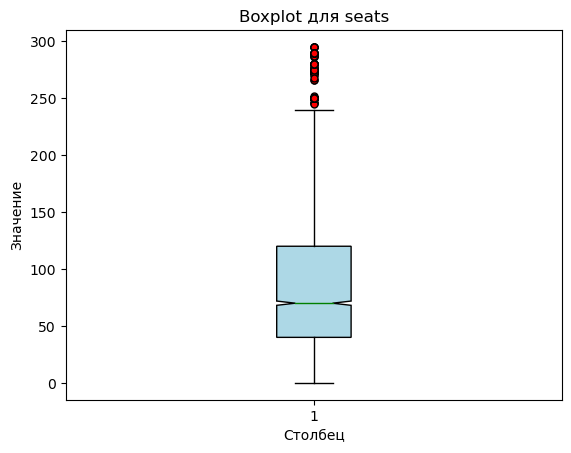

In [13]:

# Удаление строк с пропущенными значениями в столбце 'seats'
data_cleaned = moscow_places.dropna(subset=['seats'])

# Приведение столбца 'seats' к числовому типу данных
data_cleaned['seats'] = data_cleaned['seats'].astype(float)
# Построение boxplot для столбца 'seats'

plt.boxplot(data_cleaned['seats'], notch=True, patch_artist=True, boxprops=dict(facecolor='lightblue'), flierprops=dict(marker='o', markersize=5, markerfacecolor='red'), whiskerprops=dict(color='black'), medianprops=dict(color='green'))
# Настройка осей и заголовка

plt.xlabel('Столбец')
plt.ylabel('Значение')
plt.title('Boxplot для seats')

# Отображение графика
plt.show()

Обработаем пропуски, заменим nan на заглушки  

In [14]:
# функция перебора nan значений и замена их на выбранный тип данных 
def fillna_multiple(df, columns, fill_values):
    for col, fill_value in zip(columns, fill_values):
        df[col] = df[col].fillna(fill_value)
    return df
fill_values = ['Нет данных','Нет данных','Нет данных',-77777.0,-88888.0,-99999]
list_c = ['hours', 'price', 'avg_bill', 'middle_avg_bill', 'middle_coffee_cup', 'seats']
data = fillna_multiple(moscow_places, list_c, fill_values)

In [15]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8093 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8093 non-null   object 
 1   category           8093 non-null   object 
 2   address            8093 non-null   object 
 3   district           8093 non-null   object 
 4   hours              8093 non-null   object 
 5   lat                8093 non-null   float64
 6   lng                8093 non-null   float64
 7   rating             8093 non-null   float64
 8   price              8093 non-null   object 
 9   avg_bill           8093 non-null   object 
 10  middle_avg_bill    8093 non-null   float64
 11  middle_coffee_cup  8093 non-null   float64
 12  chain              8093 non-null   object 
 13  seats              8093 non-null   float64
dtypes: float64(6), object(8)
memory usage: 948.4+ KB


Пропусков не осталось.

### Добавление столбцов

Добавим столбец street с улицей на которой находится кафейня.

In [16]:
data['street'] =  data.address.apply(lambda x: x.split(',')[1])

Проверим еще раз таблицу на неявные дубоекаты по названию кафе и адресу.

Добавим столбец is_24/7 в котром будет True будет обозначать, что кафе работает круглосуточно и ежидневно. False в противоположном случае

In [17]:
data['is_24/7'] = np.where(data['hours'].isin(['ежедневно, круглосуточно']), True, False)

### Обработка неявных дубликатов

Столбец 'name' переведем в нижний регистр 

In [18]:
data.name = data.name.str.lower()

Обработаем неявные дубликаты которые обнаружили при работе с данными и приведем к одному типу.

In [19]:
contains_ch = data[data['name'].str.contains('чайхана', case=False)]
contains_ch_list = contains_ch['name'].tolist()
data.name = data.name.replace(contains_ch_list, 'чайхана')

In [20]:
rename_list = ['яндекс лавка','яндекс','лавка']
data.name = data.name.replace(rename_list, 'яндекс.лавка')

In [21]:
contains_shk = data[data['street'].str.contains('Шкулёва', case=False)]
contains_ch_list = contains_ch['street'].tolist()
data.name = data.name.replace(contains_ch_list, 'улица Шкулёва')

### Меняем тип данных

In [22]:
data.seats = data.seats.astype('int')

In [23]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8093 entries, 0 to 8405
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8093 non-null   object 
 1   category           8093 non-null   object 
 2   address            8093 non-null   object 
 3   district           8093 non-null   object 
 4   hours              8093 non-null   object 
 5   lat                8093 non-null   float64
 6   lng                8093 non-null   float64
 7   rating             8093 non-null   float64
 8   price              8093 non-null   object 
 9   avg_bill           8093 non-null   object 
 10  middle_avg_bill    8093 non-null   float64
 11  middle_coffee_cup  8093 non-null   float64
 12  chain              8093 non-null   object 
 13  seats              8093 non-null   int64  
 14  street             8093 non-null   object 
 15  is_24/7            8093 non-null   bool   
dtypes: bool(1), float64(5), 

## Анализ данных 

In [24]:
plt.style.use('ggplot') # Меняем стидь графика

### Категории заведений 

Что иследуем: 
- Какие категории заведений представлены в данных? Исследуйте количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Ответьте на вопрос о распределении заведений по категориям.

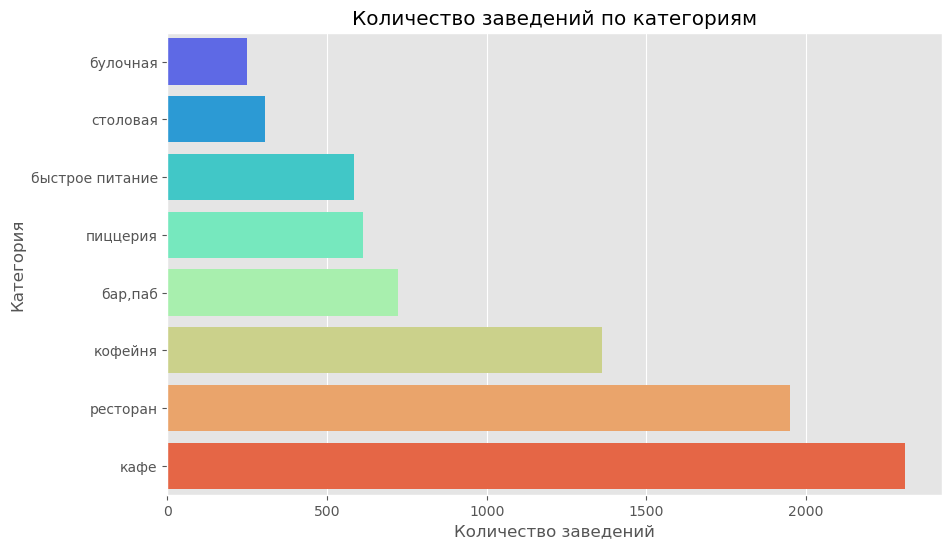

In [25]:
category_data = data.groupby('category')['name'].count().sort_values().reset_index()
plt.figure(figsize=(10, 6))
# Построение горизонтальной столбчатой диаграммы
sns.barplot ( x = 'name', y = 'category', data = category_data, palette = 'rainbow',ci='sd')


plt.xlabel('Количество заведений')
plt.ylabel('Категория')
plt.title('Количество заведений по категориям')
plt.show()

Ожидаемо в тройке самых популярных заведений входят: кафе, рестораны, кофейни.
Менее 500 заведений приходиться на столовые и булочный. 

### Количество посадочных мест в местах по категориям

Что иследуем: 
- Исследуйте количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Проанализируйте результаты и сделайте выводы.

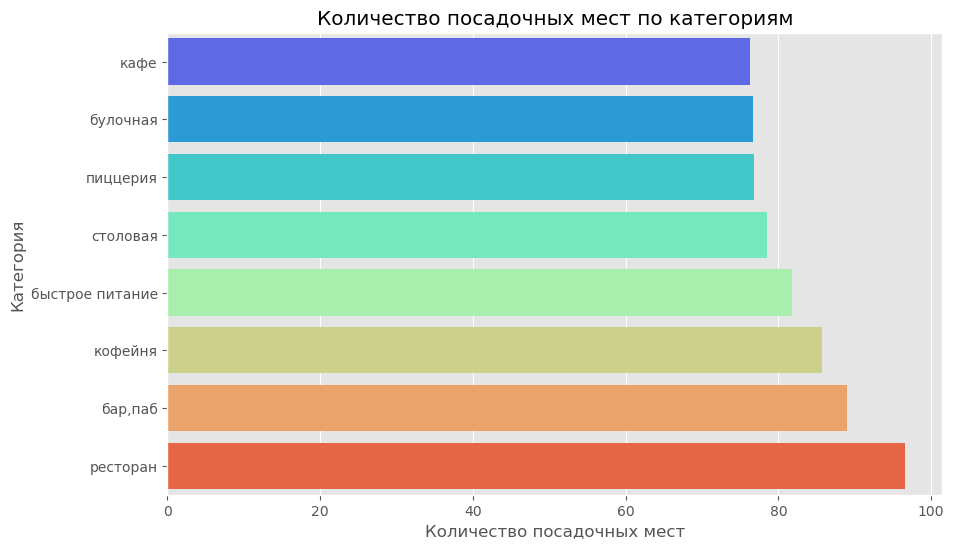

In [26]:
# Удаление строк с заглушкой в столбце 'seats'
category_seats = data[data['seats'] != -99999]
# Группировка по категориям и подсчет количества посадочных мест в каждой категории
category_seats = category_seats.groupby(['category']).agg({'seats':'mean'}).reset_index()
category_seats = category_seats.sort_values('seats')
# Построение горизонтальной столбчатой диаграммы
plt.figure(figsize=(10, 6))
sns.barplot ( x = 'seats', y = 'category', data = category_seats, palette = 'rainbow',ci='sd')


plt.xlabel('Количество посадочных мест')
plt.ylabel('Категория')
plt.title('Количество посадочных мест по категориям')
plt.show()

Вывод: мы вывели среднее количество посадочных мест по категориям и выяснили что у ресторана в среднем больше всего посадочных мест, на втором месте бар, паб. Это логично, т.к. обычно в этих заведениях проводят больше времени, на эти заведения тратят больше ресурсов на интерьер, на кухню. В кафе, пиццерии, булочной так же можно поесть внутри помещение, но так же они работают и на заказы с собой.

### Сетевые/Не сетевые 

Что иследуем: 
- Рассмотрите и изобразите соотношение сетевых и несетевых заведений в датасете. Каких заведений больше?
- Какие категории заведений чаще являются сетевыми? Исследуйте данные и ответьте на вопрос графиком.

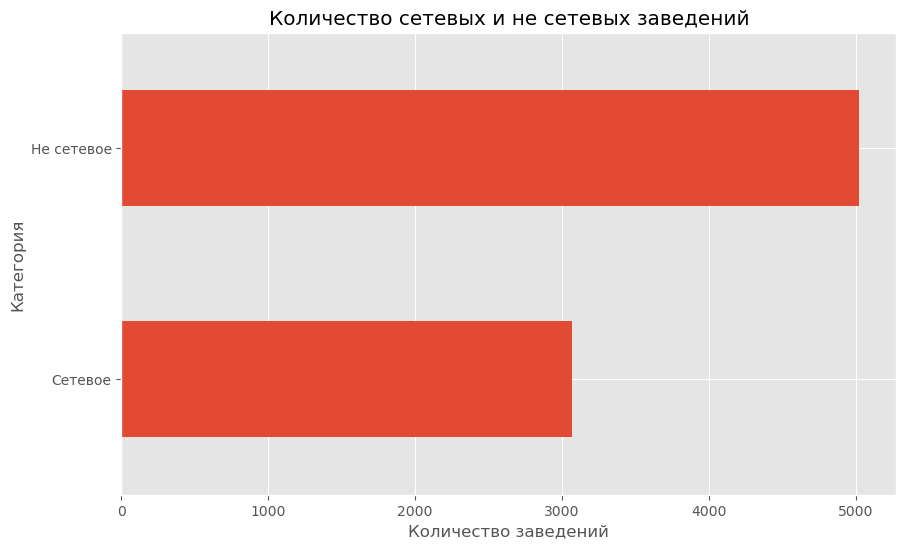

In [27]:
chain_or_not = data.groupby('chain')['name'].count().sort_values()
# Построение горизонтальной столбчатой диаграммы
chain_or_not.plot(kind='barh', figsize=(10, 6))

plt.xlabel('Количество заведений')
plt.ylabel('Категория')
plt.title('Количество сетевых и не сетевых заведений')
plt.show()

Не сетевых заведений больше примерно на 2000, чем не сетевых.

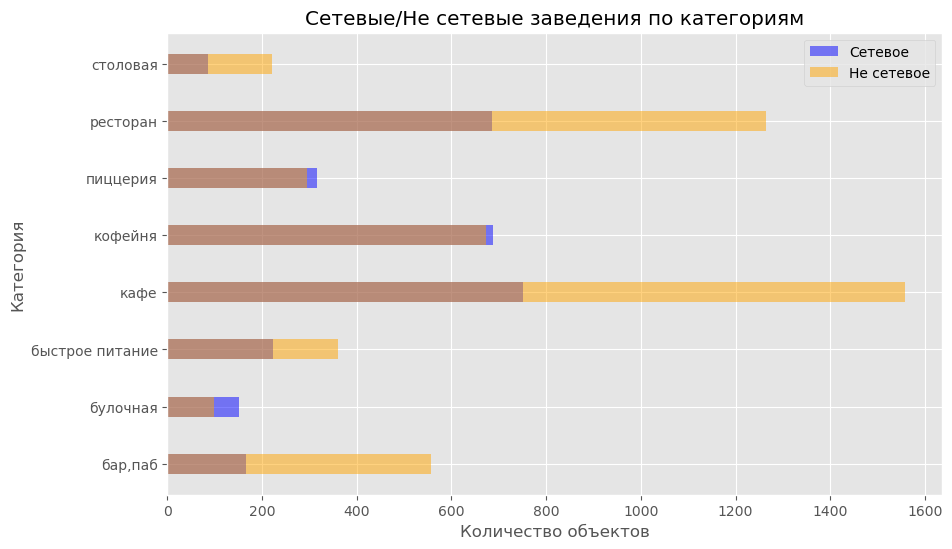

In [28]:

chain= pd.pivot_table(data,columns='chain' , index='category',values ='name', aggfunc = 'count')

plt.figure(figsize=(10, 6))
categories = chain.index
bar_width = 0.35

# Создание столбцов для сетевых заведений
plt.barh(categories, chain['Сетевое'], bar_width, label='Сетевое', color='blue', alpha=0.5)

# Создание столбцов для несетевых заведений
plt.barh(categories, chain['Не сетевое'], bar_width, label='Не сетевое', color='orange', alpha=0.5)

plt.xlabel('Количество объектов')
plt.ylabel('Категория')
plt.title('Сетевые/Не сетевые заведения по категориям')
plt.legend()
plt.show()

Сетевыми являютсяя чаще пиццерии, кофейни, булочные.

### Топ-15 популярных сетей в Москве.

Что иследуем: 
- Сгруппируйте данные по названиям заведений и найдите топ-15 популярных сетей в Москве. Под популярностью понимается количество заведений этой сети в регионе. Постройте подходящую для такой информации визуализацию. Знакомы ли вам эти сети? Есть ли какой-то признак, который их объединяет? К какой категории заведений они относятся?

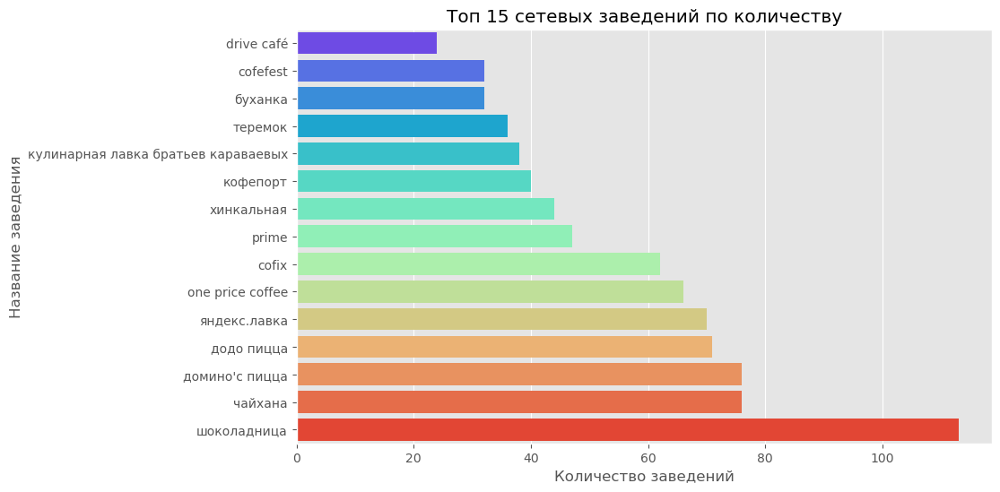

In [29]:
pop_chain = data[data['chain'] == 'Сетевое']
pop_chain = pop_chain.groupby(['name']).agg(count=('name', 'count'))
pop_chain = pop_chain.rename(columns={'count': 'Количество заведений'})
top_15 = pop_chain.nlargest(15, 'Количество заведений')
top_15 = top_15.sort_values('Количество заведений')

plt.figure(figsize=(10, 6))
sns.barplot(x=top_15['Количество заведений'], y=top_15.index, palette='rainbow')

plt.xlabel('Количество заведений')
plt.ylabel('Название заведения')
plt.title('Топ 15 сетевых заведений по количеству')
plt.show()

В топе 15 сетевых заведений попали пиццирии Додо пицца, Домино'с пицца.
Доставка еды Яндекс Лавка
Самой популярной сетью оказалась Шоколадница.
Но в основном сетевыми заведениями являются небольшие кофейни!

### Административные районы Москвы

Что иследуем: 
- Какие административные районы Москвы присутствуют в датасете? Отобразите общее количество заведений и количество заведений каждой категории по районам. Попробуйте проиллюстрировать эту информацию одним графиком.

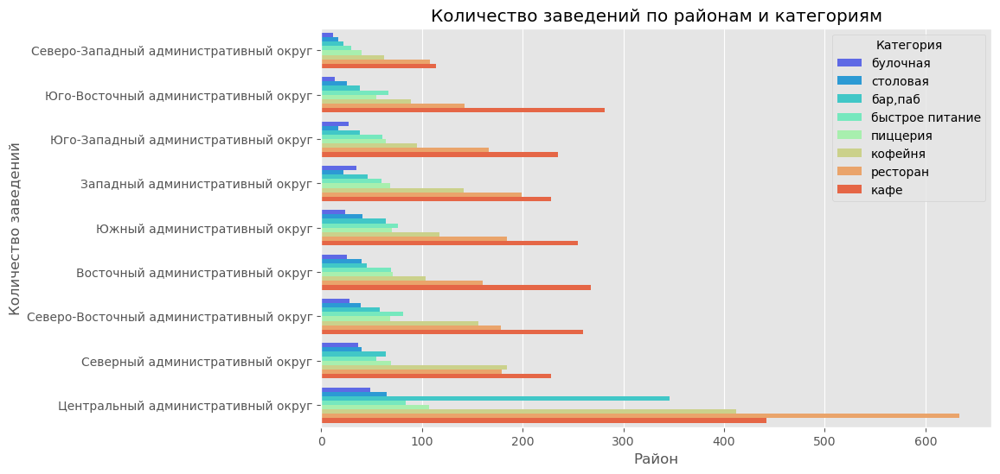

In [30]:
district_sort = data.groupby(['district','category'])['name'].count().reset_index()
district_sort = district_sort.sort_values('name')
plt.figure(figsize=(10, 6))
sns.barplot(x='name', y='district', hue='category', data=district_sort, palette='rainbow')
plt.xlabel('Район')
plt.ylabel('Количество заведений')
plt.title('Количество заведений по районам и категориям')
plt.legend(title='Категория')
plt.show()


In [31]:
import plotly.express as px

fig = px.bar(district_sort, x='name', y='district', color='category',
             labels={'name': 'Количество заведений', 'district': 'Район'},
             title='Количество заведений по районам и категориям',
             orientation='h')

fig.show()

### Рейтинг

Что иследуем: 
- Визуализируйте распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита?

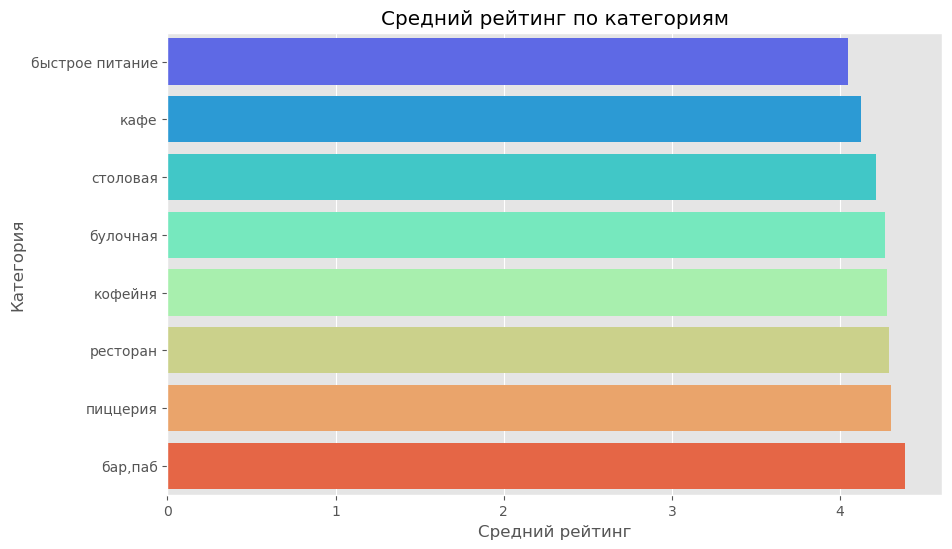

In [32]:
rating = data.groupby('category').agg({'rating':'mean'}).reset_index()
rating = rating.rename(columns={'rating': 'Рейтинг'})
rating = rating.sort_values('Рейтинг')
plt.figure(figsize=(10, 6))
sns.barplot(x='Рейтинг', y='category', data=rating, palette='rainbow')
plt.xlabel('Средний рейтинг')
plt.ylabel('Категория')
plt.title('Средний рейтинг по категориям')
plt.show()


### Средний рейтинг заведений каждого района

Что иследуем: 
- Постройте фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. Границы районов Москвы, которые встречаются в датасете, хранятся в файле admin_level_geomap.geojson (скачать файл для локальной работы).
- Отобразите все заведения датасета на карте с помощью кластеров средствами библиотеки folium.

In [33]:
district = data.groupby('district').agg({'rating':'mean'}).reset_index()
district = district.rename(columns={'rating': 'Рейтинг','district': 'Район'})
district


,Район,Рейтинг
0,Восточный административный округ,4.172506
1,Западный административный округ,4.181352
2,Северный административный округ,4.239953
3,Северо-Восточный административный округ,4.150576
4,Северо-Западный административный округ,4.210617
5,Центральный административный округ,4.378869
6,Юго-Восточный административный округ,4.100423
7,Юго-Западный административный округ,4.173826
8,Южный административный округ,4.178099


In [34]:
# читаем файл и сохраняем в переменной
try:
    with open ('admin_level_geomap.geojson', 'r') as f:
        geo_json = json.load( f)
except:
    with open('/Users/nikitaromanov/nikitaaromanovv/data-analytics-projects/food-market-analysis/admin_level_geomap.geojson', 'r') as f:
        geo_json = json.load (f)



In [35]:

moscow_lat, moscow_lng = 55.751244, 37.618423
# создаём карту Москвы
mosco = folium.Map(location=(moscow_lat, moscow_lng), zoom_start=10)

 

folium.Choropleth(
    geo_data=geo_json,
    data=district,
    columns=['Район', 'Рейтинг'],
    key_on='feature.properties.name',
    fill_color='RdYlBu',
    fill_opacity=0.8,
    legend_name='Рейтинг заведений по районам Москвы'
).add_to(mosco)

mosco


Все заведения датасета на карте.

In [36]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

### Топ-15 улиц по количеству заведений

Что иследуем: 
- Найдите топ-15 улиц по количеству заведений. Постройте график распределения количества заведений и их категорий по этим улицам. Попробуйте проиллюстрировать эту информацию одним графиком.
- Найдите улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях?

In [37]:
top_15_streets = data.groupby(['street']).agg(cnt_venues_on_street=('name', 'count')).sort_values(by='cnt_venues_on_street', ascending=False).reset_index().head(15)
street_category = data.groupby(['street', 'category']).agg(cnt_venues_by_category_on_street=('name', 'count')).reset_index()
top_15_streets = top_15_streets.merge(street_category, on='street', how='left')
fig = px.bar(top_15_streets, x='cnt_venues_on_street', y='street', color='category', text='category')
fig.update_xaxes(tickangle=45)

fig.update_layout(title='Распределение заведений на ТОП-15 улицах Москвы\n',
                  xaxis_title='Количество заведений',
                  yaxis_title='Улица',
                  yaxis={'categoryorder': 'total ascending'})
fig.show()


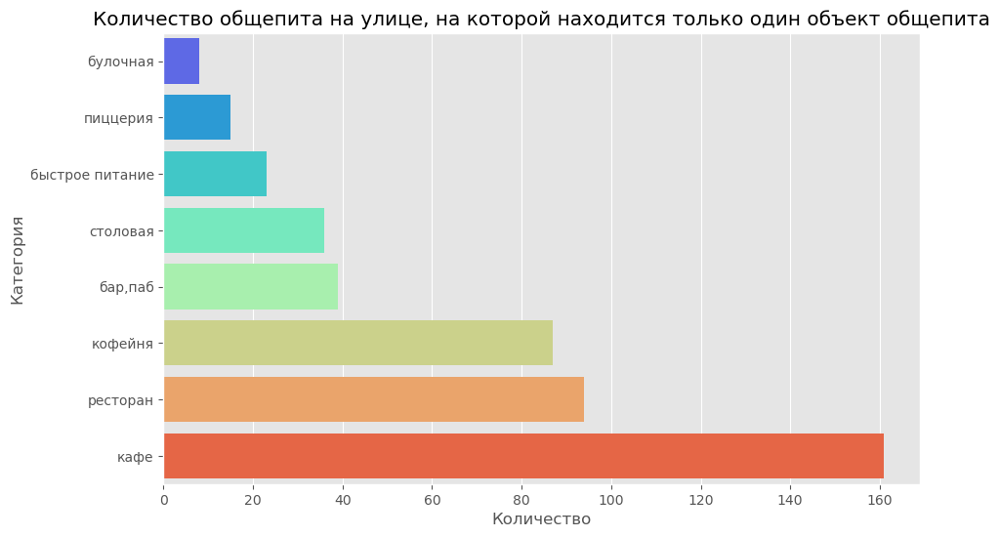

In [38]:
street_category = data.groupby(['street']).agg(cnt_venues_by_category_on_street=('name', 'count')).reset_index()
street_category = street_category[street_category['cnt_venues_by_category_on_street'] == 1]
filtered_data = street_category.merge(data, on='street', how='left')
selected_columns = filtered_data[['street', 'name', 'category']]
gr_columns = selected_columns.groupby('category').agg(count_category=('name', 'count')).reset_index()
gr_columns = gr_columns.sort_values('count_category')
gr_columns
plt.figure(figsize=(10, 6))
sns.barplot(x='count_category', y='category', data=gr_columns, ci='sd', palette='rainbow')
plt.xlabel('Количество')
plt.ylabel('Категория')
plt.title('Количество общепита на улице, на которой находится только один объект общепита')
plt.show()

### Картограмма с средней ценой по районам

Что иследуем: 
- Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитайте медиану этого столбца для каждого района. Используйте это значение в качестве ценового индикатора района. Постройте фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализируйте цены в центральном административном округе и других. Как удалённость от центра влияет на цены в заведениях?

In [39]:
# Удаление строк с заглушкой в столбце 'middle_avg_bill'
district_middle_avg_bill = data[data['middle_avg_bill'] != -77777]
district_middle_avg_bill = district_middle_avg_bill.groupby('district').agg({'middle_avg_bill':'mean'}).reset_index()
district_middle_avg_bill = district_middle_avg_bill.rename(columns={'middle_avg_bill': 'Средняя цена на районе','district': 'Район'})
district_middle_avg_bill = district_middle_avg_bill.sort_values('Средняя цена на районе')
district_middle_avg_bill

,Район,Средняя цена на районе
6,Юго-Восточный административный округ,649.192708
3,Северо-Восточный административный округ,698.814433
7,Юго-Западный административный округ,792.712446
0,Восточный административный округ,814.342520
4,Северо-Западный административный округ,821.083333
8,Южный административный округ,844.777397
2,Северный административный округ,922.760000
1,Западный административный округ,1031.708772
5,Центральный административный округ,1190.948847


In [40]:
moscow_lat, moscow_lng = 55.751244, 37.618423
# создаём карту Москвы
mosco = folium.Map(location=(moscow_lat, moscow_lng), zoom_start=10)

 

folium.Choropleth(
    geo_data=geo_json,
    data=district_middle_avg_bill,
    columns=['Район', 'Средняя цена на районе'],
    key_on='feature.properties.name',
    fill_color='RdYlBu',
    fill_opacity=0.8,
    legend_name='Медианный средний чек заведений по районам Москвы'
).add_to(mosco)

mosco


## Детализируем исследование: открытие кофейни

Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Попробуйте определить, осуществима ли мечта клиентов.

Ответьте на следующие вопросы:
- Сколько всего кофеен в датасете? 
- В каких районах их больше всего, каковы особенности их расположения?
- Есть ли круглосуточные кофейни?
- Какие у кофеен рейтинги? 
- Как они распределяются по районам?
- На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

In [41]:
coffee = data[data['category']== 'кофейня']
print(f"Всего количесво кофеен {coffee.category.count()}.")

Всего количесво кофеен 1360.


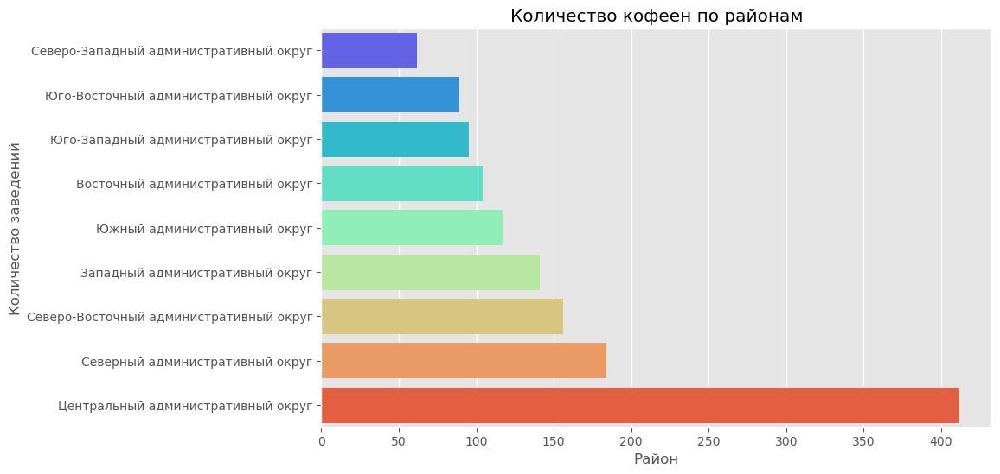

In [42]:
district_coffee = coffee.groupby(['district','category'])['name'].count().reset_index()
district_coffee = district_coffee.sort_values('name')
plt.figure(figsize=(10, 6))
sns.barplot(x='name', y='district', data=district_coffee, palette='rainbow')
plt.xlabel('Район')
plt.ylabel('Количество заведений')
plt.title('Количество кофеен по районам')

plt.show()

Больше всего кофеен в ЦАО, более чем в 2 раза относительно других административных округов. 

In [43]:
coffee24 = coffee[coffee['is_24/7'] == True]
print(f"Всего круглосуточных кофеен {coffee24.name.count()}.")


Всего круглосуточных кофеен 58.


In [44]:
ratings = coffee['rating'].unique()
print("У кофеен следующие рейтинги:")
for rating in ratings:
    print(rating)

У кофеен следующие рейтинги:
5.0
4.3
4.0
3.6
3.8
3.1
4.1
4.9
4.8
4.5
4.4
4.2
2.9
3.5
4.6
3.9
4.7
2.2
2.0
3.0
3.7
3.2
2.3
1.4
2.6
3.3
3.4
2.8


In [45]:
average_rating = coffee['rating'].mean()
rounded_average_rating = round(average_rating, 2)
print(f"Средний рейтинг кофеен: {rounded_average_rating}")


Средний рейтинг кофеен: 4.28


In [46]:
rating_by_district = coffee.groupby('district').agg(rating_mean=('rating', 'mean')).round(2)
rating_by_district = rating_by_district.reset_index().sort_values('rating_mean')
print("Распределение рейтингов кофеен по районам:")
print(rating_by_district)


Распределение рейтингов кофеен по районам:
                                  district  rating_mean
1          Западный административный округ         4.20
3  Северо-Восточный административный округ         4.22
8             Южный административный округ         4.22
6     Юго-Восточный административный округ         4.23
0         Восточный административный округ         4.28
7      Юго-Западный административный округ         4.29
2          Северный административный округ         4.30
4   Северо-Западный административный округ         4.33
5       Центральный административный округ         4.34


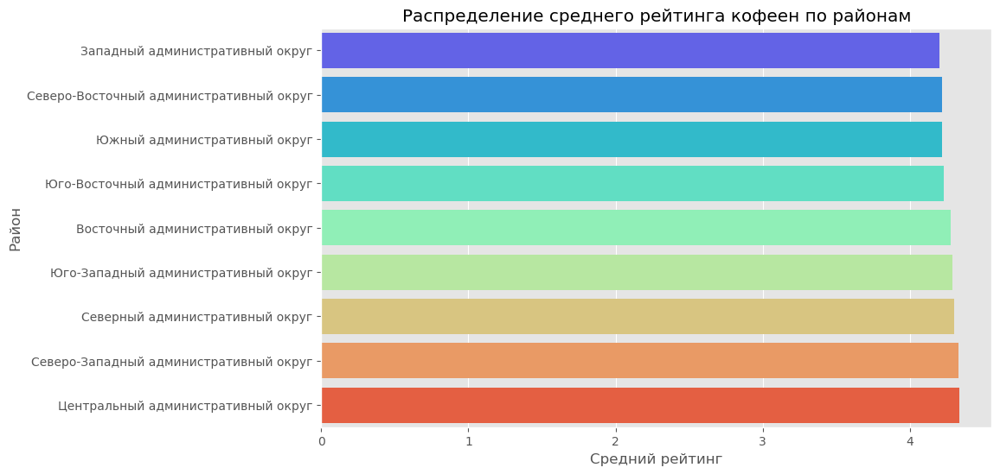

In [47]:


plt.figure(figsize=(10, 6))
sns.barplot(x='rating_mean', y='district', data=rating_by_district, palette='rainbow')
plt.xlabel('Средний рейтинг')
plt.ylabel('Район')
plt.title('Распределение среднего рейтинга кофеен по районам')
plt.show()


In [48]:
coffee_middle_coffee_cup = coffee[(coffee['middle_coffee_cup'] != -88888) & (coffee['chain'] == 'Не сетевое')]
coffee_middle_coffee_cup_by_district = coffee_middle_coffee_cup.groupby('district')['middle_coffee_cup'].mean().round(0)
coffee_middle_coffee_cup_by_district = coffee_middle_coffee_cup_by_district.reset_index().sort_values('middle_coffee_cup')
print("Распределение средней цены чашки капучино по районам:")
print(coffee_middle_coffee_cup_by_district)


Распределение средней цены чашки капучино по районам:
                                  district  middle_coffee_cup
0         Восточный административный округ              137.0
6     Юго-Восточный административный округ              152.0
4   Северо-Западный административный округ              162.0
3  Северо-Восточный административный округ              165.0
8             Южный административный округ              174.0
2          Северный административный округ              177.0
7      Юго-Западный административный округ              188.0
1          Западный административный округ              197.0
5       Центральный административный округ              199.0


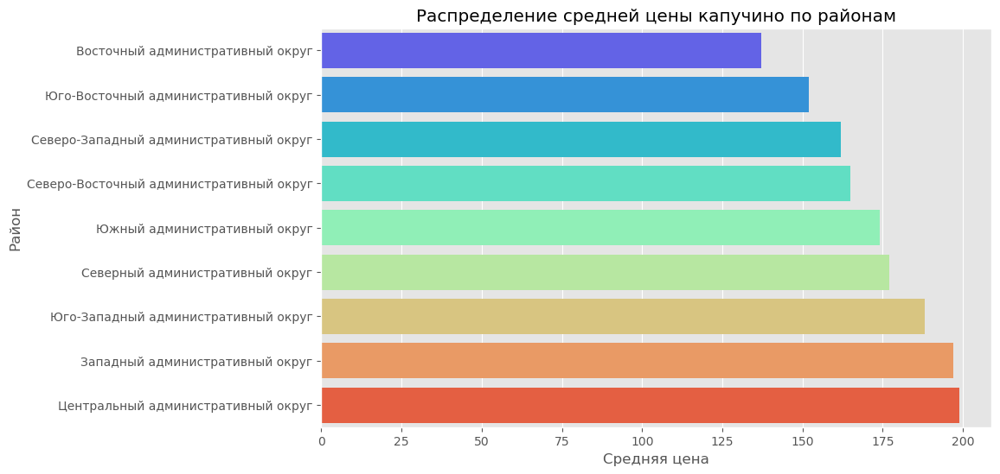

In [49]:
coffee_middle_coffee_cup = coffee[(coffee['middle_coffee_cup'] != -88888) & (coffee['chain'] == 'Не сетевое')]
coffee_middle_coffee_cup_by_district = coffee_middle_coffee_cup.groupby('district')['middle_coffee_cup'].mean().round(0)
coffee_middle_coffee_cup_by_district = coffee_middle_coffee_cup_by_district.reset_index().sort_values('middle_coffee_cup')

# Преобразование столбца 'middle_coffee_cup' в числовой тип данных
coffee_middle_coffee_cup_by_district['middle_coffee_cup'] = pd.to_numeric(coffee_middle_coffee_cup_by_district['middle_coffee_cup'])

plt.figure(figsize=(10, 6))
sns.barplot(x='middle_coffee_cup', y='district', data=coffee_middle_coffee_cup_by_district, palette='rainbow')
plt.xlabel('Средняя цена')
plt.ylabel('Район')
plt.title('Распределение средней цены капучино по районам')
plt.show()



## Выводы

Исследование было выполнено полностью!
Мною получены ответы на все основные вопросы, заказчиков и построена визуализация этого.
Всего в датасете было 1360 кофеен.
Самый популярный район, где больше всего оказалось кофеен это Центральный административный округ.
Средний рейтинг кофеен: 4.28
Распределение рейтингов кофеен по районам представлен в разделе 4.
Самая большая средняя цена чашки капучино оказалась в Центральном административном округе - 199 рублей
Наименьшая в Восточный административный округ - 137 рублей.
Распределение по всем район представлено в разделе 4